In [2]:
pwd

'/Users/yoobinkwak/Desktop/prac'

In [15]:
import os
from os.path import join, basename, dirname, isfile, isdir

import re

import nibabel as nb
import numpy as np
import pandas as pd
# import pp

import matplotlib.pyplot as plt
import matplotlib

import seaborn as sns
%matplotlib inline


# from __future__ import division
import pickle

import glob

In [16]:
mni_3mm_loc = 'mni_brain_ds3.nii.gz'
mni_3mm_img = nb.load(mni_3mm_loc)
mni_3mm_data = mni_3mm_img.get_data()

In [17]:
thalamus_mask_loc = 'masks/bi_thalamus_HOSC_60_ds3.nii.gz'
thalamus_mask_img = nb.load(thalamus_mask_loc)
thalamus_mask_data = thalamus_mask_img.get_data()

---

# Make function first

In [18]:
def get_brain_figures(imgLoc_or_img_data, 
                      title='title', outputDir='', 
                      save=False, axial=True, 
                      thalamus_highlight=False):
    # Read nifty images
    try:
        img = nb.load(imgLoc_or_img_data)
        data = img.get_data()
    # if imgLoc_or_img_data is already a matrix
    except:
        data = imgLoc_or_img_data
    
    # figure height
    if axial:
        fig_height=5.5
    else:
        fig_height=4
    
    # make frame
    fig, axes = plt.subplots(ncols=4, # number of columns in the figure
                             nrows=2, # number of rows in the figure
                             figsize=(9, fig_height), 
                             dpi=100, # resolution
                             gridspec_kw={'wspace':0, 'hspace':0}, # space between axes
                             squeeze=True)
        
    # Lowest slice number to show
    # axial view
    if axial:
        if thalamus_highlight:
            slice_num=23
        else:
            slice_num=20
            
    # sagittal view
    else:
        #slice_num=15
        slice_num=15
    
    # loop through axes
    for num, ax in enumerate(np.ravel(axes)):       
        if axial:
            if thalamus_highlight:
                mni_2d_slice = np.flipud(mni_3mm_data[15:45, 25:45, slice_num].T)
                thalamus_mask_data_masked = np.flipud(np.ma.masked_where(thalamus_mask_data < 1, 
                                                                         thalamus_mask_data)[15:45, 25:45, slice_num].T)
                img_2d_slice = np.flipud(np.ma.masked_where(data < 2.3, data)[15:45, 25:45, slice_num].T)

            else:
                mni_2d_slice = np.flipud(mni_3mm_data[:, :, slice_num].T)
                img_2d_slice = np.flipud(np.ma.masked_where(data < 2.3, data)[:, :, slice_num].T)

                    # MNI background
        else:
            if thalamus_highlight:
                thalamus_mask_data_masked = np.flipud(np.ma.masked_where(thalamus_mask_data < 1, 
                                                                         thalamus_mask_data)[slice_num, :, :].T)
                mni_2d_slice = np.flipud(mni_3mm_data[slice_num, :, :].T)
                img_2d_slice = np.flipud(np.ma.masked_where(data < 2.3, data)[slice_num, :, :].T)

            else:
                mni_2d_slice = np.flipud(mni_3mm_data[slice_num, :, :].T)
                img_2d_slice = np.flipud(np.ma.masked_where(data < 2.3, data)[slice_num, :, :].T)

        ax.imshow(mni_2d_slice, cmap=plt.cm.gray)
        if thalamus_highlight:
            ax.imshow(thalamus_mask_data_masked, 
                      cmap='coolwarm', 
                      alpha=0.3)
        zthrmap = ax.imshow(img_2d_slice, cmap='autumn', 
                            vmin=2.3,
                            vmax=6)
        # remove labels
        ax.set_xticklabels('')
        ax.set_yticklabels('')
        ax.set_xticks([])
        ax.set_yticks([])

        # Coordinate
        if axial:
            new_coord = mni_3mm_img.affine[:3, :3].dot([0,0,slice_num]) + mni_3mm_img.affine[:3,3]
            ax.set_xlabel(int(new_coord[-1]), fontsize=15)
            if thalamus_highlight:
                slice_num = slice_num + 1
            else:
                slice_num = slice_num + 3

        else:
            new_coord = mni_3mm_img.affine[:3, :3].dot([slice_num, 0,0]) + mni_3mm_img.affine[:3,3]
            ax.set_xlabel(int(new_coord[0]), fontsize=15)
            slice_num = slice_num + 4

        
    fig.suptitle(title, y=0.9)

    # Add axes for the colorbar at the right side of the figure
    fig.subplots_adjust(right=0.8)
    # [*left*, *bottom*, *width*,*height*]
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])

    cbar = fig.colorbar(zthrmap, 
                        cax=cbar_ax, 
                        format='%0.1f')
    cbar.set_label('Z values', fontsize=15)
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.yaxis.set_label_position('left')
    
    if save==False:
        fig.show()
    else:
        if not isdir(outputDir):
            os.mkdir(outputDir)
        fig.savefig('{}/{}.png'.format(outputDir, title))
        plt.close()

/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


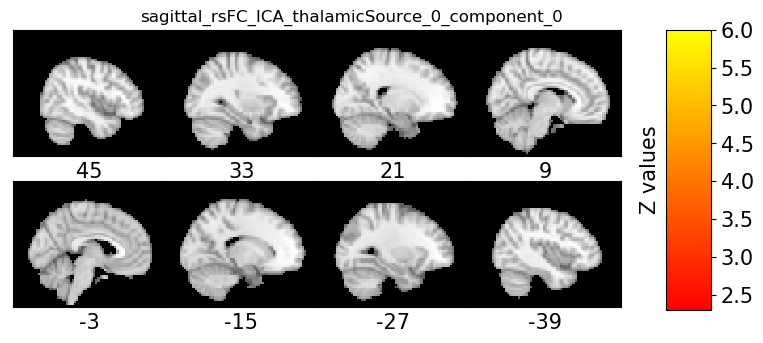

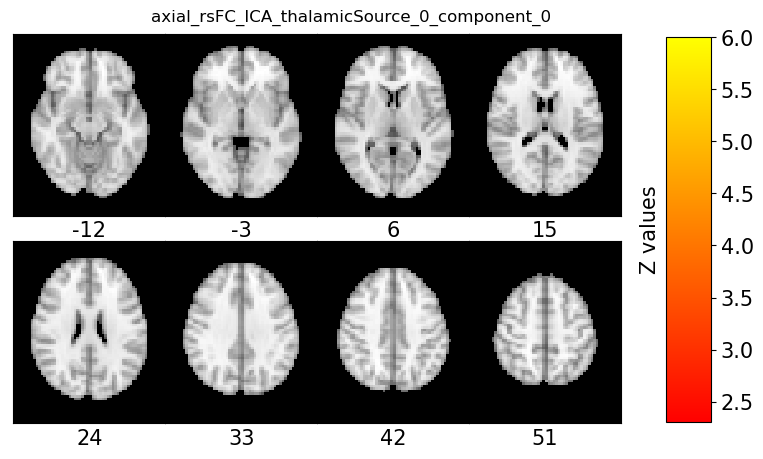

In [19]:
get_brain_figures(df.iloc[0]['location'], 
                  title='sagittal_rsFC_ICA_thalamicSource_{}_component_{}'.format(0, 0),
                  outputDir='testing_figures', 
                  save=False,
                  axial=False)

get_brain_figures(df.iloc[0]['location'], 
                  title='axial_rsFC_ICA_thalamicSource_{}_component_{}'.format(0, 0),
                  outputDir='testing_figures', 
                  save=False,
                  axial=True)

---

> # 1. rsFC_ICA
Three dimensional images

In [36]:
images = glob.glob('rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC_*') 
#images = glob.glob('/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180109/wmSC_ICA_mICA/ds3_left_fwhm6/dim0/stats/thresh_zstat*') 

df = pd.DataFrame({'location':images})
df['side'] = df['location'].str.findall('bi').str[0]
#df['side'] = df['location'].str.findall('(left|right)').str[0]
df['number'] = df['location'].str.findall('00(\d{2})').str[0]
df.head()
df


,location,side,number
0,rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC_00...,bi,00
1,rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC_00...,bi,01
2,rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC_00...,bi,02
3,rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC_00...,bi,03
4,rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC_00...,bi,04
5,rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC_00...,bi,05
6,rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC_00...,bi,06
7,rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC_00...,bi,07
8,rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC_00...,bi,08
9,rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC_00...,bi,09


/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


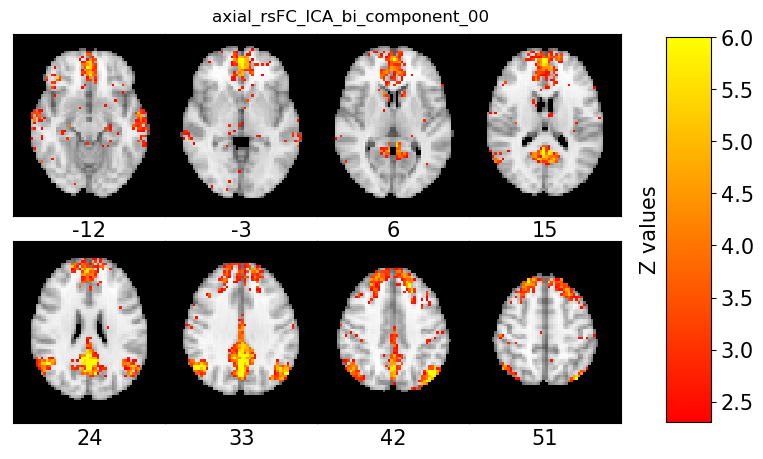

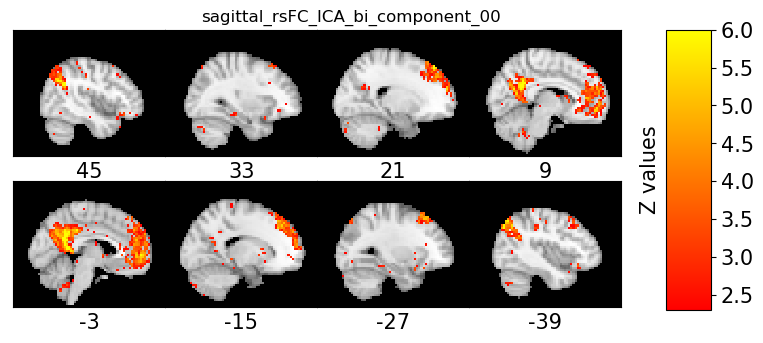

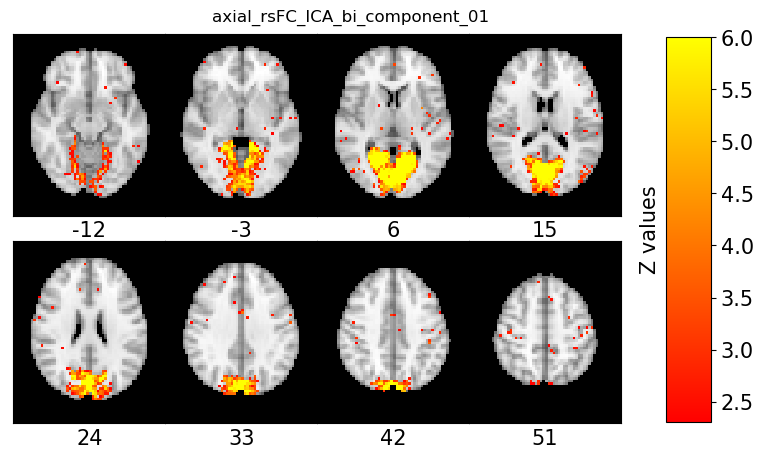

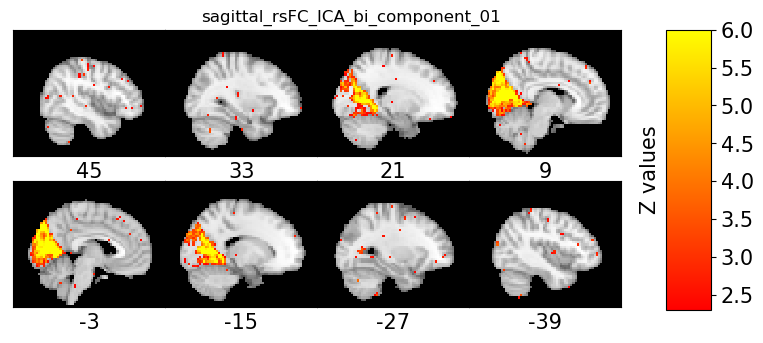

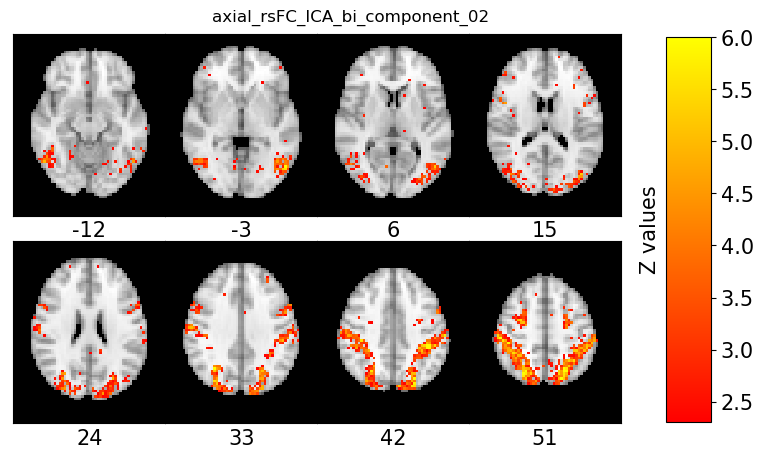

...

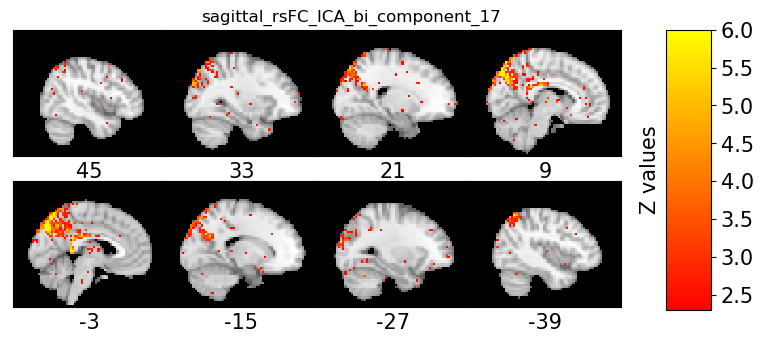

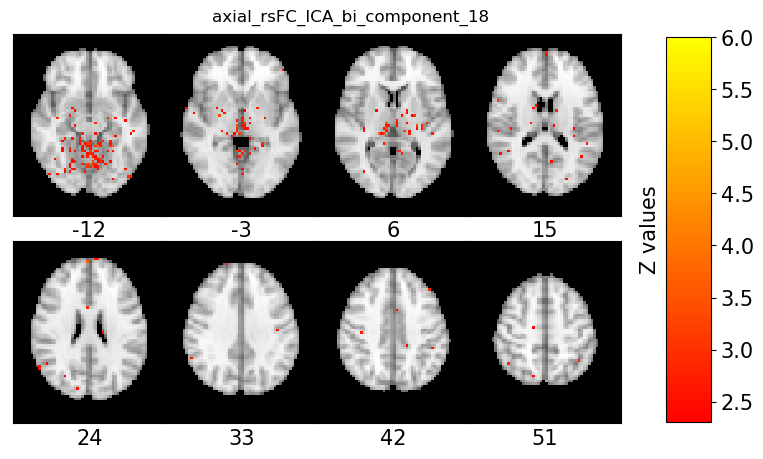

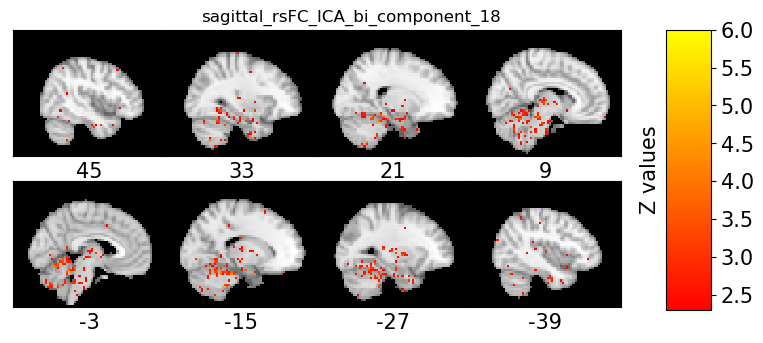

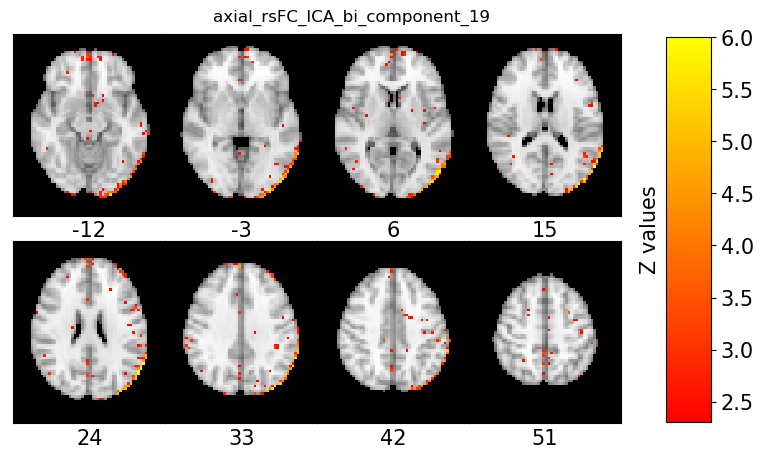

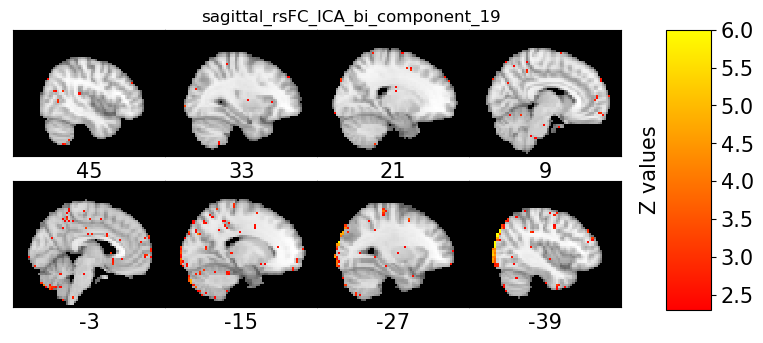

In [40]:
for index, row in df.iterrows():
# for index, row in df.iloc[:1].iterrows():
    get_brain_figures(row['location'], 
                      title='axial_rsFC_ICA_{}_component_{}'.format(row['side'], row['number']),
                      outputDir='testing_figures', 
                      save=False)
    
    get_brain_figures(row['location'], 
                      title='sagittal_rsFC_ICA_{}_component_{}'.format(row['side'], row['number']),
                      outputDir='testing_figures', 
                      save=False,
                      axial=False)
    

> # 2 rsFC_ICA Dual Regression Output 

In [51]:
#tensor_ICA_temporal_regression_images=glob.glob(join('/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180109', 
                                                     #'NOR103_ATH',
                                                     #'DualRegression_TensorICA',
                                                     #'TemporalRegression_Stage2')+'/*left*/z2.3*')

#tensor_ICA_temporal_regression_images=glob.glob(join('/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180109',
                                                     #'NOR103_ATH',
                                                     #'DualRegression_TensorICA',
                                                     #'TemporalRegression_Stage2')+'/*right*/z2.3*')
            
regression_images=glob.glob('rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sample_tfce/*demeaned_tstat1*')

In [52]:
df = pd.DataFrame({'location':regression_images})
df['side'] = df['location'].str.findall('bi').str[0]
df['number'] = df['location'].str.findall('IC(\d{2})').str[0]
df.head()
df

,location,side,number
0,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,00
1,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,01
2,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,02
3,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,03
4,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,04
5,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,05
6,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,06
7,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,07
8,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,08
9,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,09


/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/anaconda3/lib/python3.6/site-packages/matplotlib/colors.py:897: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
/anaconda3/lib/python3.6/site-packages/numpy/ma/core.py:710: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


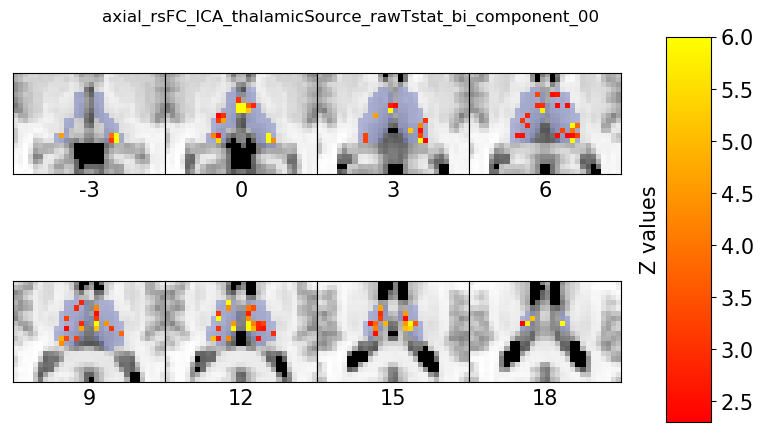

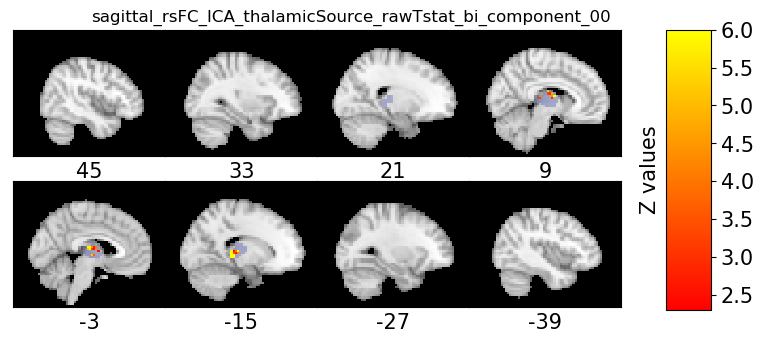

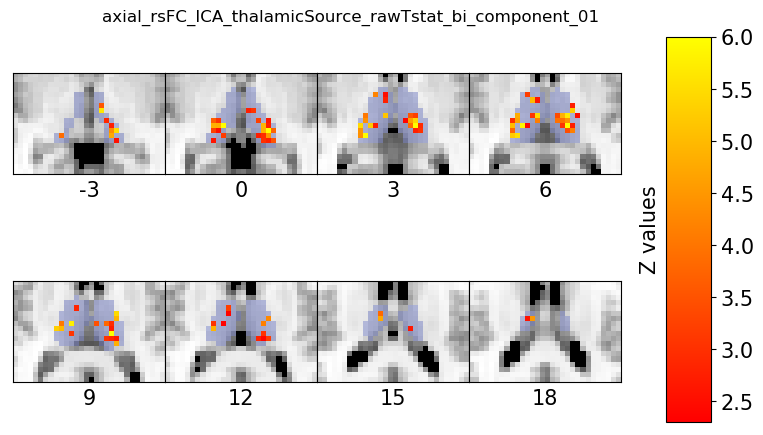

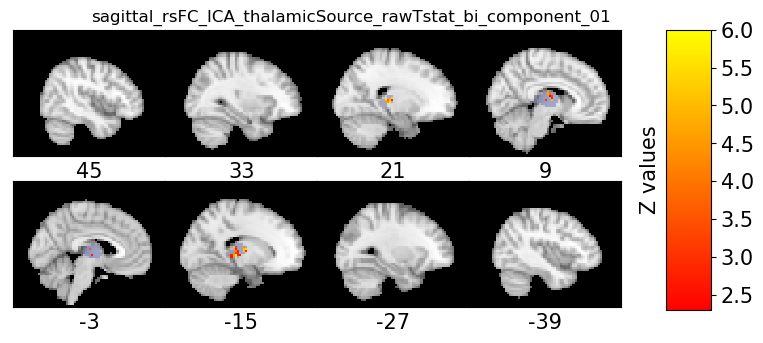

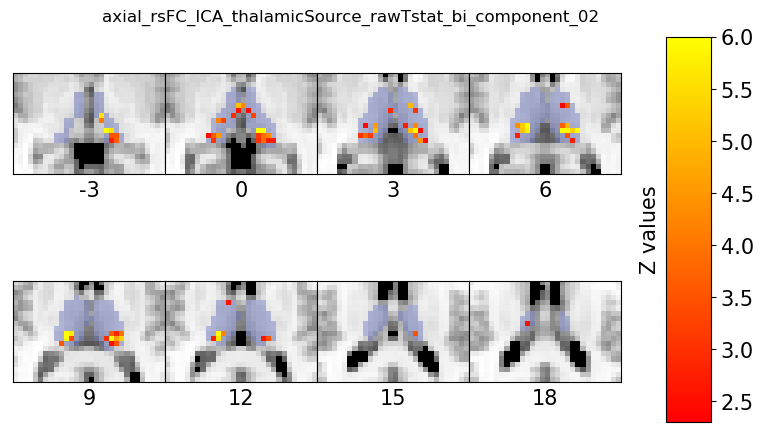

...

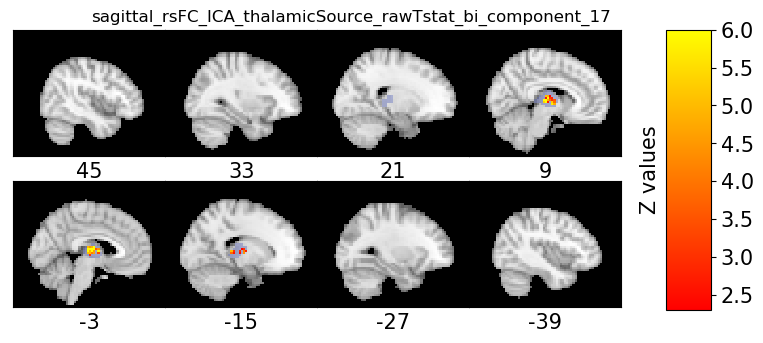

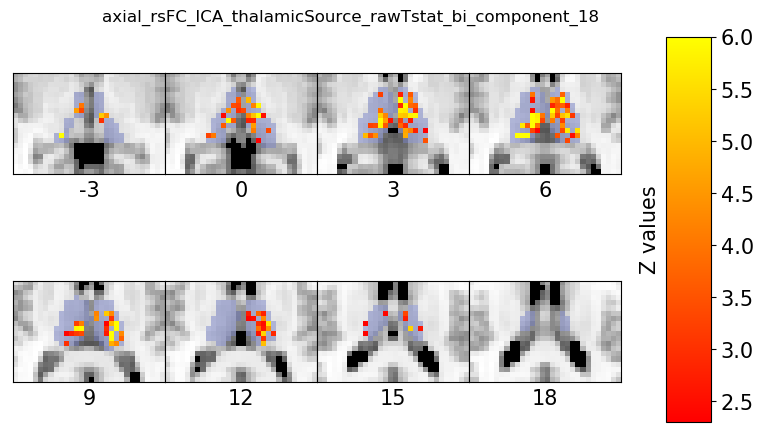

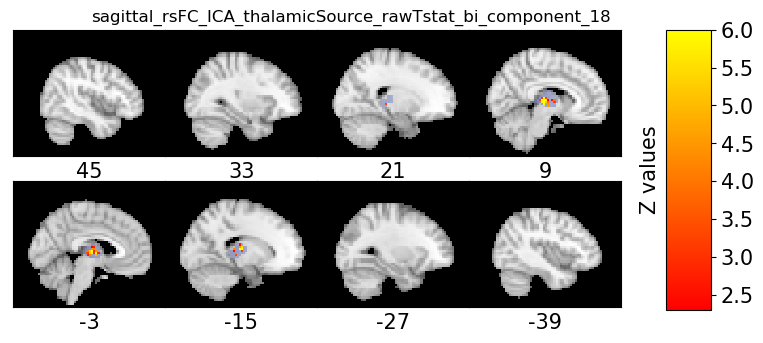

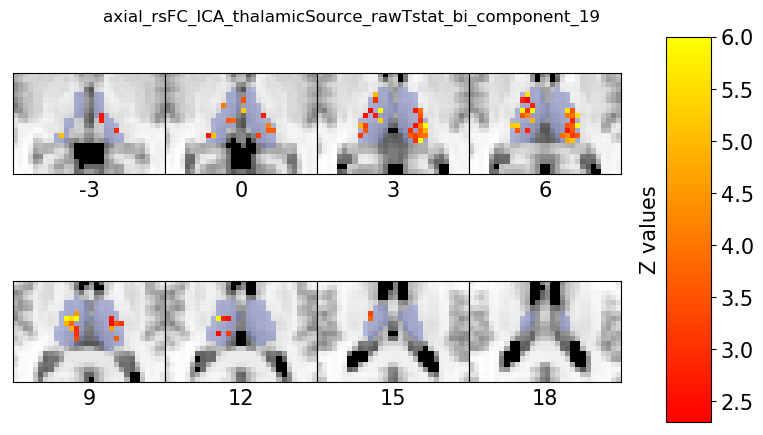

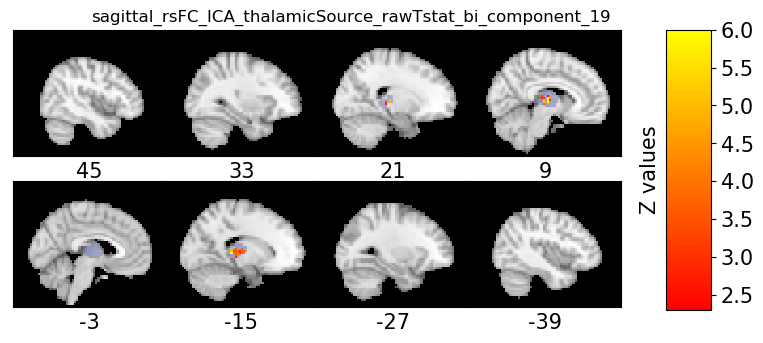

In [56]:
for index, row in df.iterrows():
    get_brain_figures(row['location'], 
                      title='axial_rsFC_ICA_thalamicSource_rawTstat_{}_component_{}'.format(row['side'], row['number']),
                      outputDir='testing_figures',
                      thalamus_highlight=True,
                      save=False)
    get_brain_figures(row['location'], 
                      title='sagittal_rsFC_ICA_thalamicSource_rawTstat_{}_component_{}'.format(row['side'], row['number']),
                      outputDir='testing_figures',
                      thalamus_highlight=True,
                      save=False, axial=False)
    
  

In [58]:
regression_images_t=glob.glob('rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sample_tfce/*demeaned_tfce_p*')

In [59]:
df = pd.DataFrame({'location':regression_images_t})
df['side'] = df['location'].str.findall('bi').str[0]
df['number'] = df['location'].str.findall('IC(\d{2})').str[0]
df.head()
df

,location,side,number
0,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,00
1,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,01
2,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,02
3,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,03
4,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,04
5,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,05
6,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,06
7,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,07
8,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,08
9,rsFC_Randomise_n80/ds3_bi_nosmooth_20ICs/1_sam...,bi,09


/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:418: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "
/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/anaconda3/lib/python3.6/site-packages/matplotlib/colors.py:897: UserWarning: Warning: converting a masked element to nan.
  dtype = np.min_scalar_type(value)
/anaconda3/lib/python3.6/site-packages/numpy/ma/core.py:710: UserWarning: Warning: converting a masked element to nan.
  data = np.array(a, copy=False, subok=subok)


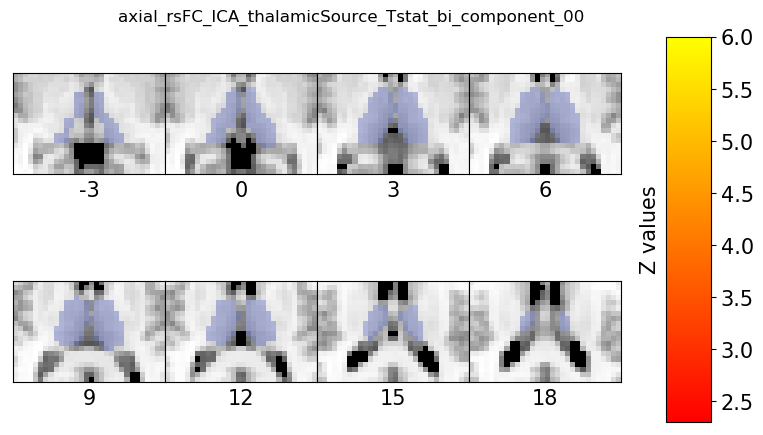

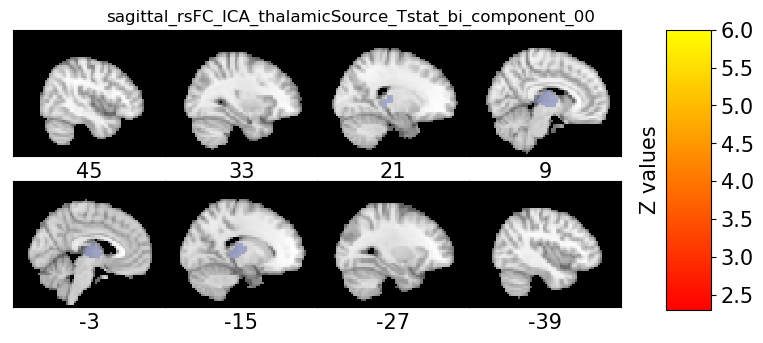

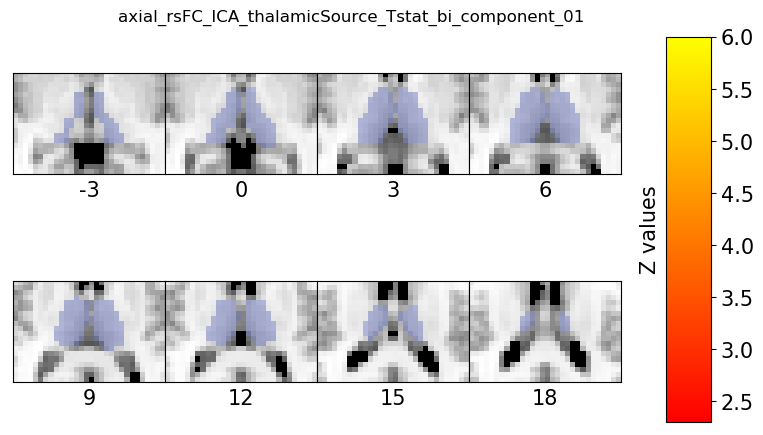

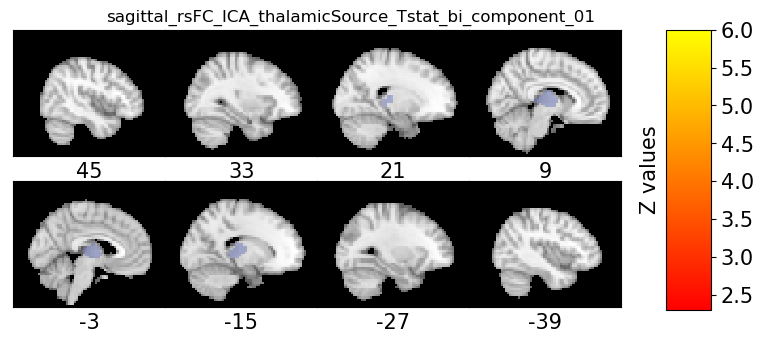

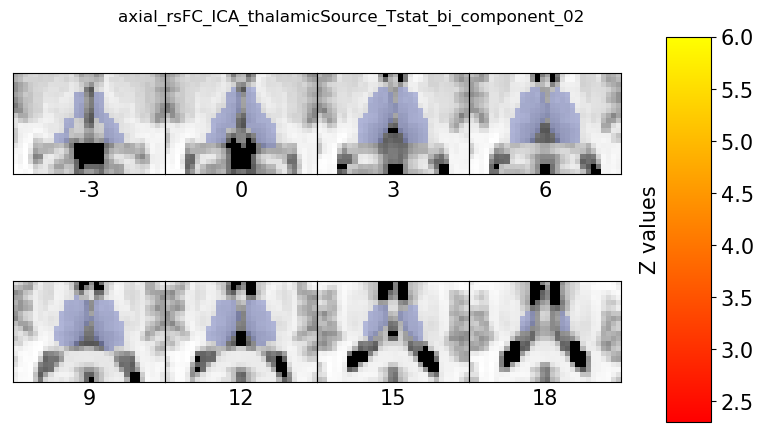

...

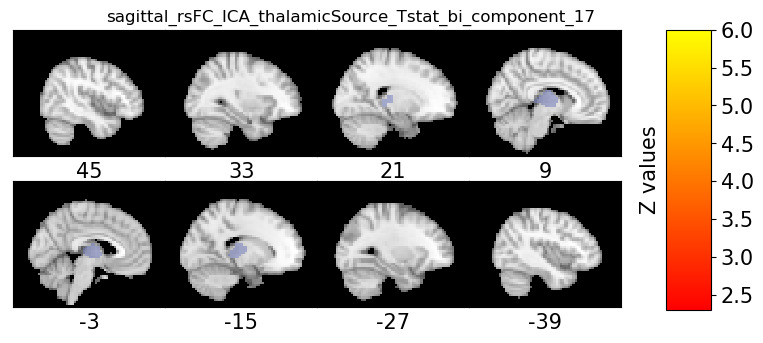

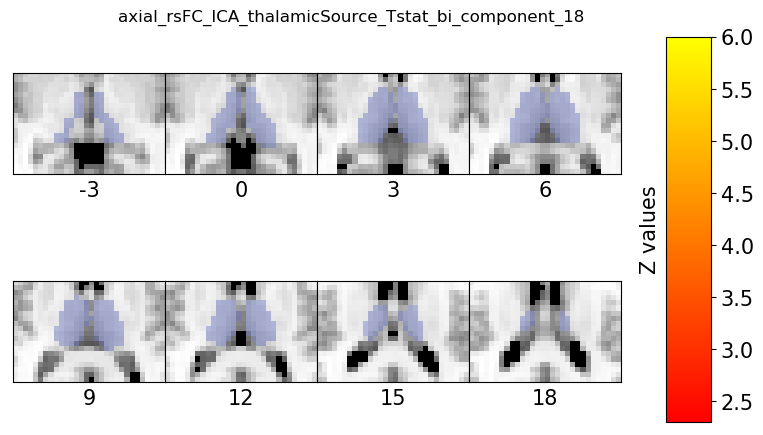

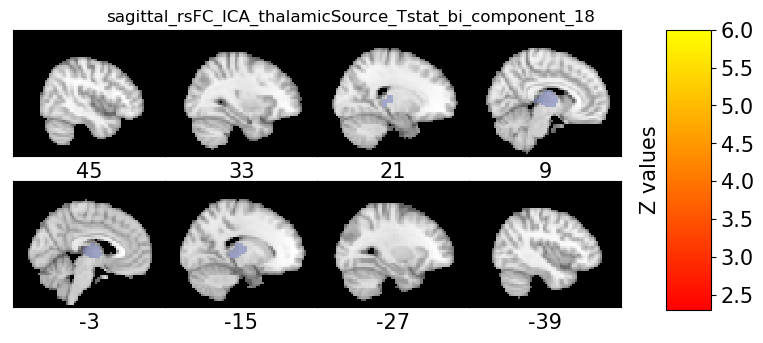

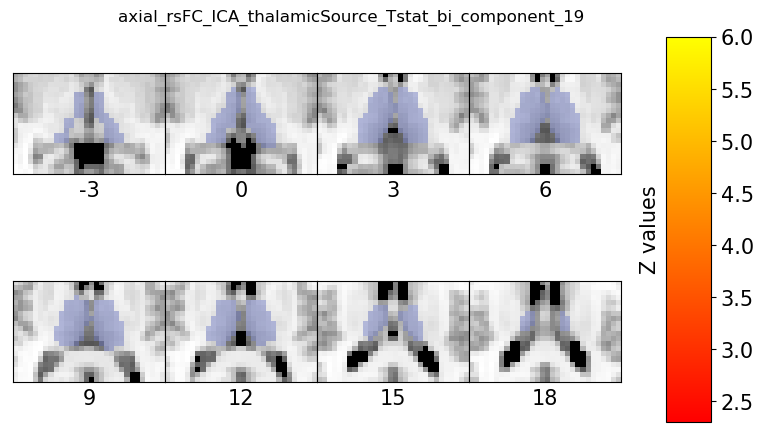

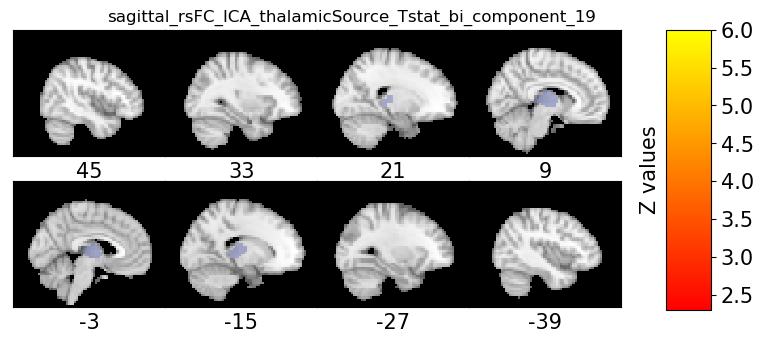

In [60]:
for index, row in df.iterrows():
    get_brain_figures(row['location'], 
                      title='axial_rsFC_ICA_thalamicSource_Tstat_{}_component_{}'.format(row['side'], row['number']),
                      outputDir='testing_figures',
                      thalamus_highlight=True,
                      save=False)
    get_brain_figures(row['location'], 
                      title='sagittal_rsFC_ICA_thalamicSource_Tstat_{}_component_{}'.format(row['side'], row['number']),
                      outputDir='testing_figures',
                      thalamus_highlight=True,
                      save=False, axial=False)

In [32]:
#tensor_ICA_wmSC_images=glob.glob(join('/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180109',
                                      #'NOR103_ATH',
                                      #'DualRegression_TensorICA',
                                      #'wmSC_pattern'+'/*left*/z2.3*'))
tensor_ICA_wmSC_images=glob.glob(join('/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180109',
                                      'NOR103_ATH',
                                      'DualRegression_TensorICA',
                                      'wmSC_pattern'+'/*right*/z2.3*'))

In [33]:
df = pd.DataFrame({'location':tensor_ICA_wmSC_images})
df['side'] = df['location'].str.findall('(left|right)').str[0]
df['number'] = df['location'].str.findall('00(\d{2})').str[0]
#df['side'] = 'left'
df.head()

,location,side,number
0,/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180...,right,01
1,/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180...,right,02
2,/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180...,right,03
3,/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180...,right,04
4,/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180...,right,05


In [34]:
for index, row in df.iterrows():
    get_brain_figures(row['location'], 
                      title='axial_tensorICA_wmSC_{}_component_{}'.format(row['side'], row['number']),
                      outputDir='wmSC_pattern_ds3_fwhm6',
                      save=True)
    get_brain_figures(row['location'], 
                      title='sagittal_tensorICA_wmSC_{}_component_{}'.format(row['side'], row['number']),
                      outputDir='wmSC_pattern_ds3_fwhm6',
                      save=True, axial=False)

> # NOR103 temporal ICA
TemporalICA

> temporal ICA Demeaned

In [36]:
#temporal_ICA_melodic_loc = '/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180109/rsFC_ICA_cmd/ds3_bi_fwhm6_20ICs_masked/melodic_IC.nii.gz'
temporal_ICA_melodic_loc = '/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180109/rsFC_ICA_cmd/ds3_bi_20ICs_masked/melodic_IC.nii.gz'
temporal_ICA_melodic_img = nb.load(temporal_ICA_melodic_loc)
temporal_ICA_melodic_data = temporal_ICA_melodic_img.get_data()

In [37]:
for componentNumber in np.arange(temporal_ICA_melodic_data.shape[-1]):
    data = temporal_ICA_melodic_data[:,:,:,componentNumber]
    get_brain_figures(data, 
                      title='axial_rsFC_ICA_melodic_{}'.format(componentNumber+1),
                      #outputDir='temporalICA_ds3_fwhm6_20ICs',
                      outputDir='temporalICA_ds3_nosmooth_20ICs',
                      save=True)

    get_brain_figures(data, 
                      title='saggital_rsFC_ICA_melodic_{}'.format(componentNumber+1),
                      #outputDir='temporalICA_ds3_fwhm6_20ICs',
                      outputDir='temporalICA_ds3_nosmooth_20ICs',
                      save=True, axial=False)

In [99]:
temporal_ICA_temporal_regression_demeaned_loc = '/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180109/NOR103_ATH/DualRegression_TemporalICA/TemporalRegression_Stage2/ds3_bi_fwhm6_20ICs/z2.3_NOR103_ATH_stage2_demeaned.nii.gz'
temporal_ICA_temporal_regression_demeaned_img = nb.load(temporal_ICA_temporal_regression_demeaned_loc)
temporal_ICA_temporal_regression_demeaned_data = temporal_ICA_temporal_regression_demeaned_img.get_data()

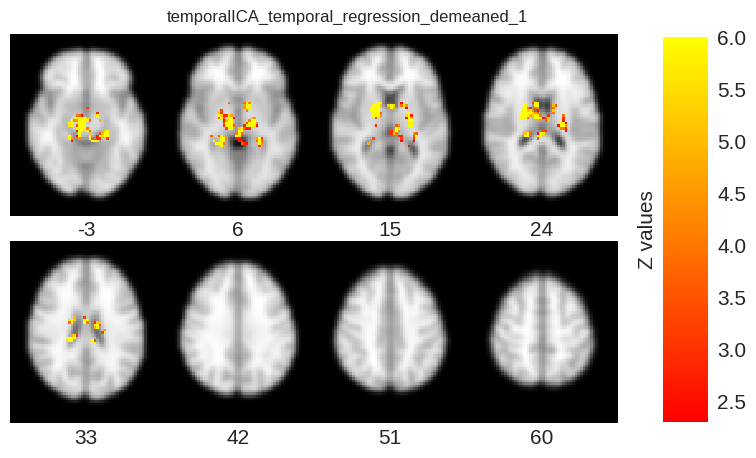

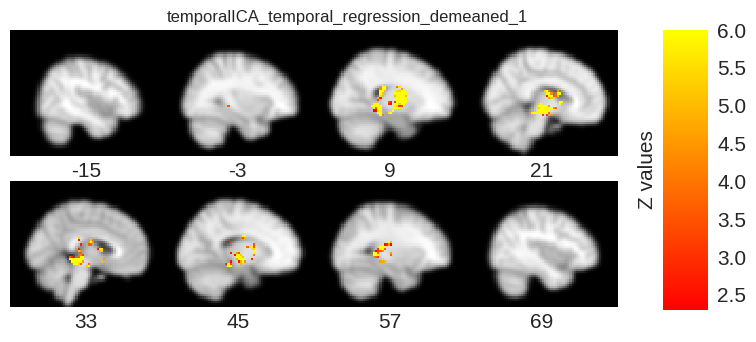

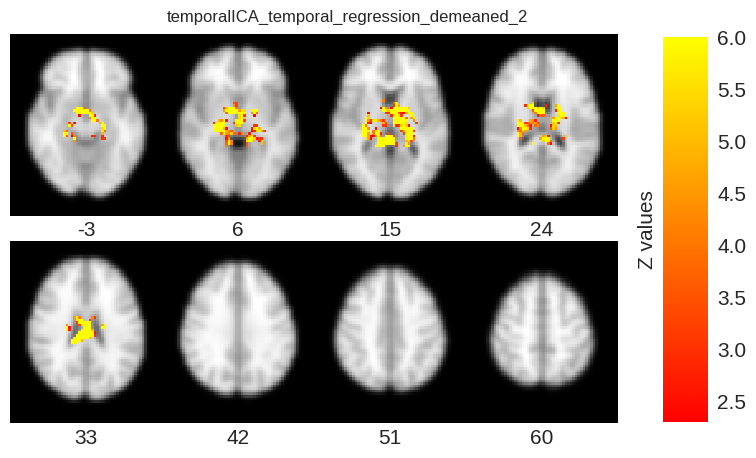

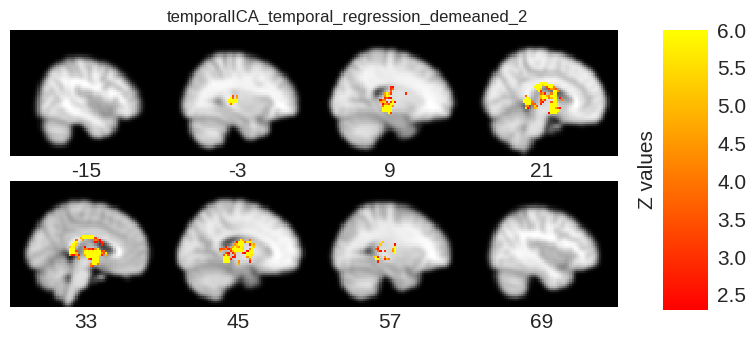

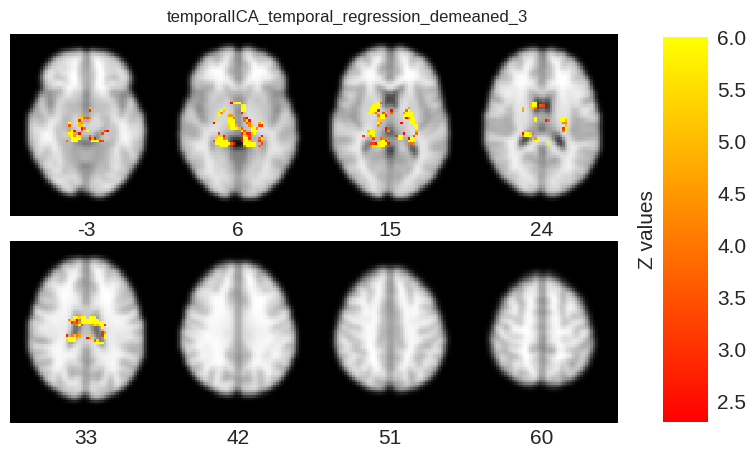

...

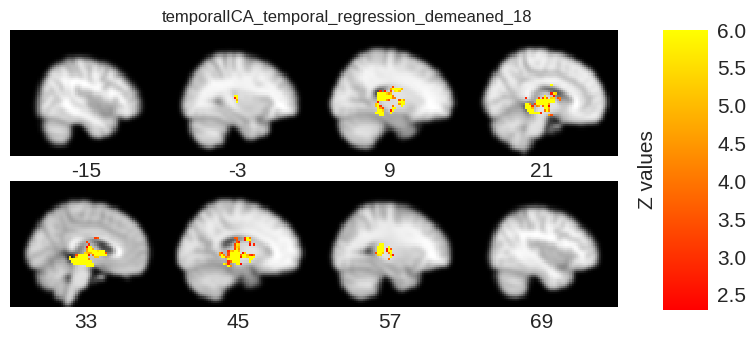

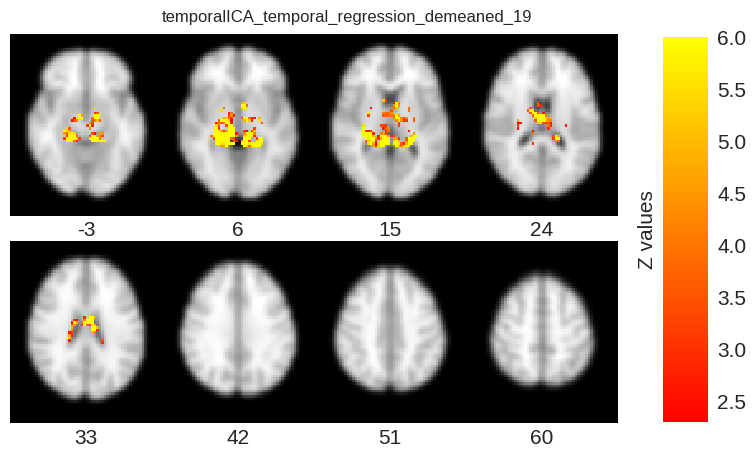

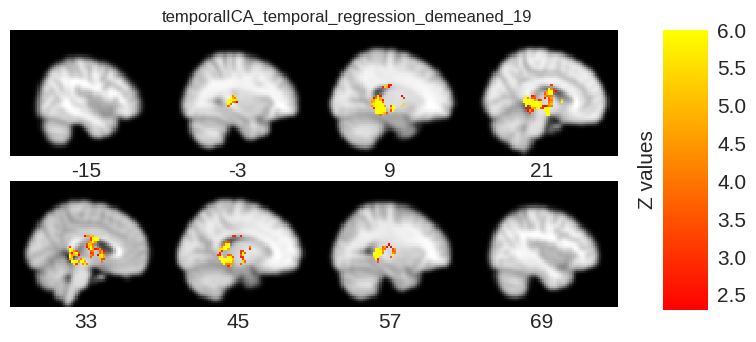

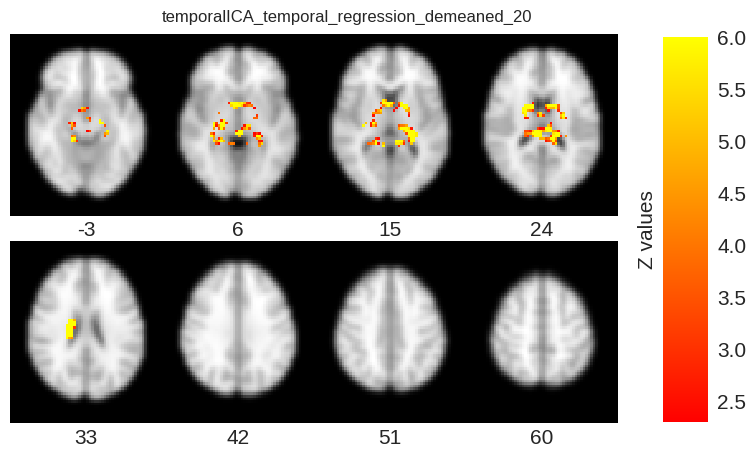

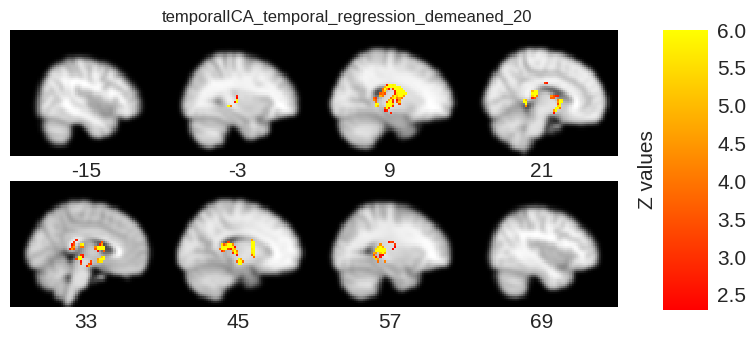

In [147]:
for componentNumber in np.arange(temporal_ICA_temporal_regression_demeaned_data.shape[-1]):
    data = temporal_ICA_temporal_regression_demeaned_data[:,:,:,componentNumber]
    get_brain_figures(data, 
                      title='temporalICA_temporal_regression_demeaned_{}'.format(componentNumber+1),
                      outputDir='temporalICA_temporal_regression',
                      save=False)

    get_brain_figures(data, 
                      title='temporalICA_temporal_regression_demeaned_{}'.format(componentNumber+1),
                      outputDir='temporalICA_temporal_regression',
                      save=False, axial=False)

> No demean

In [150]:
temporal_ICA_temporal_regression_loc = join('/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180109',
                                            'NOR103_ATH',
                                            'DualRegression_TemporalICA',
                                            'TemporalRegression_Stage2',
                                            'ds3_bi_fwhm6_20ICs/z2.3_NOR103_ATH_stage2.nii.gz')
temporal_ICA_temporal_regression_img = nb.load(temporal_ICA_temporal_regression_loc)
temporal_ICA_temporal_regression_data = temporal_ICA_temporal_regression_img.get_data()

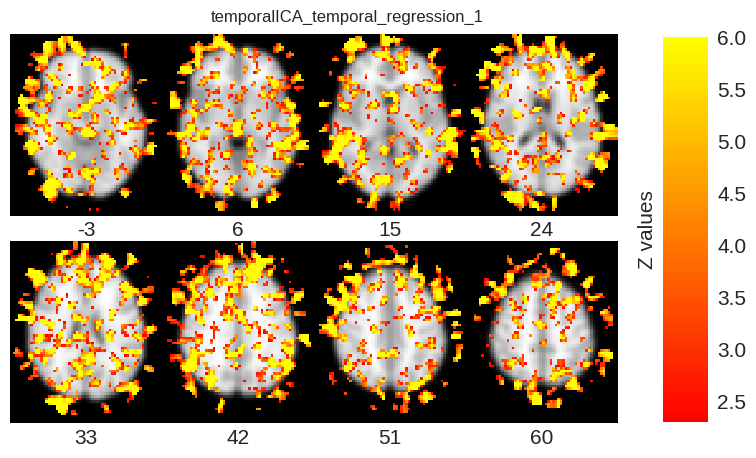

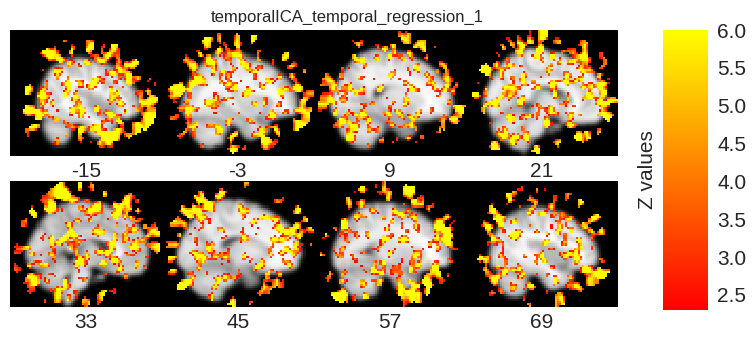

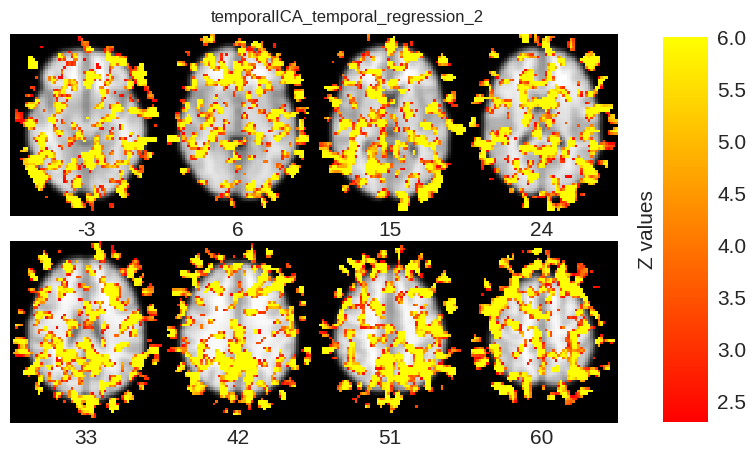

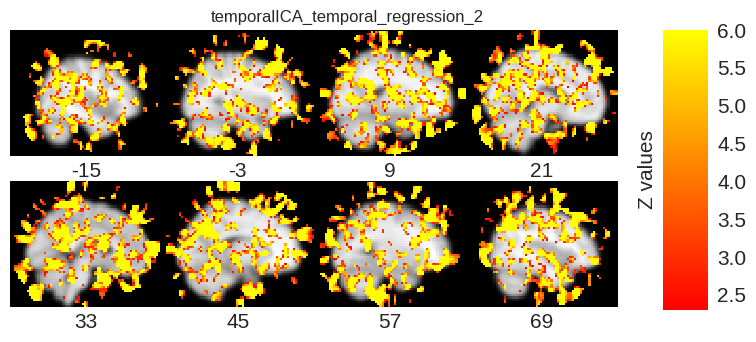

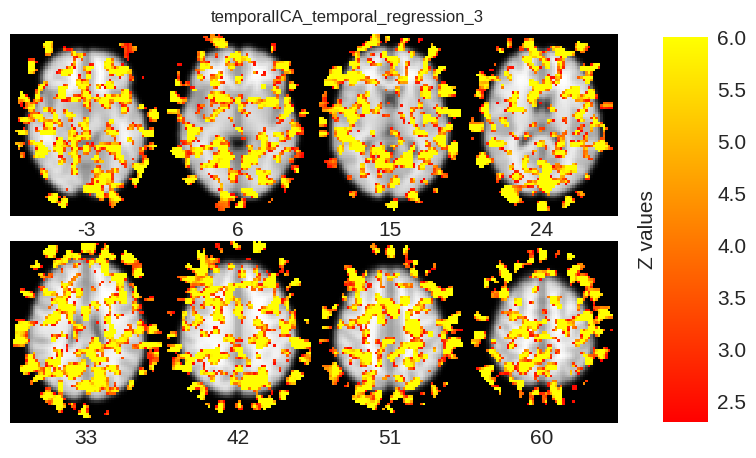

...

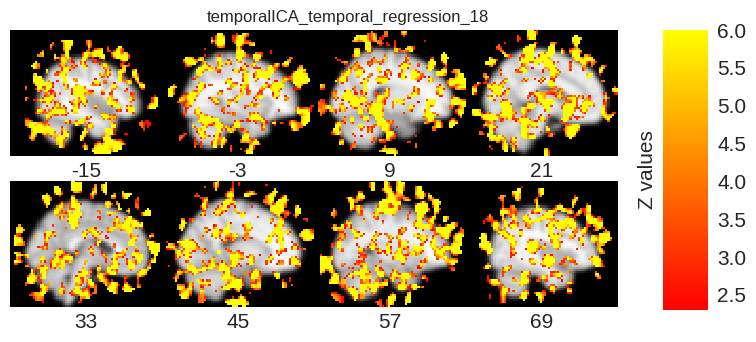

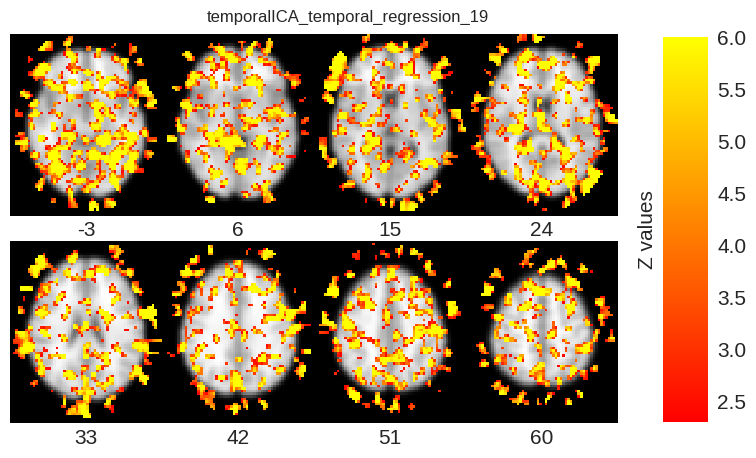

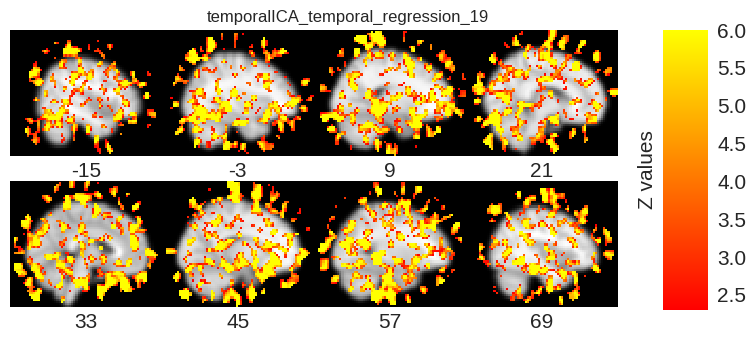

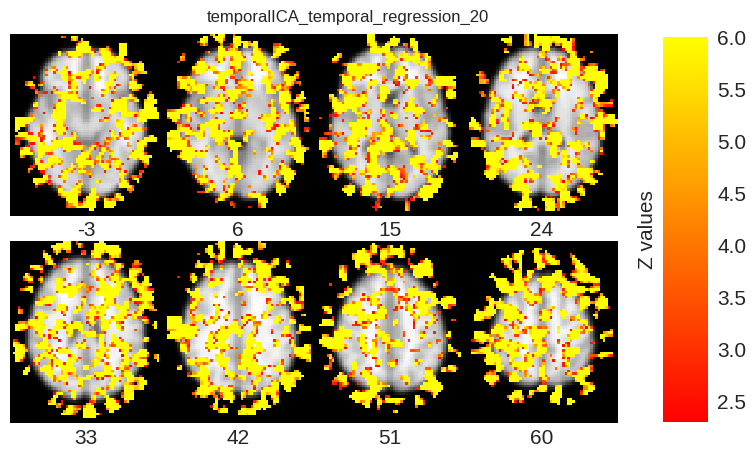

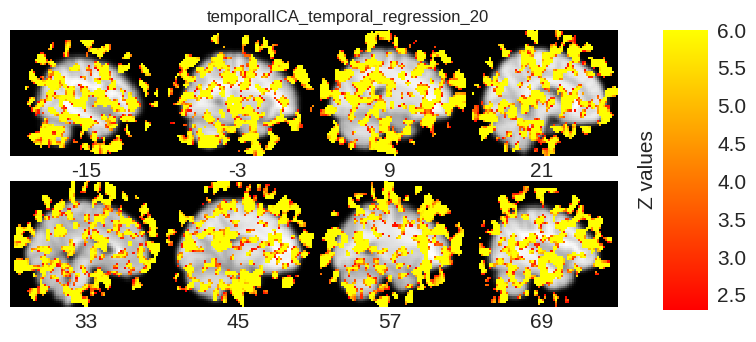

In [148]:
for componentNumber in np.arange(temporal_ICA_temporal_regression_data.shape[-1]):
    data = temporal_ICA_temporal_regression_data[:,:,:,componentNumber]
    get_brain_figures(data, 
                      title='temporalICA_temporal_regression_{}'.format(componentNumber+1),
                      outputDir='temporalICA_temporal_regression',
                      save=False)

    get_brain_figures(data, 
                      title='temporalICA_temporal_regression_{}'.format(componentNumber+1),
                      outputDir='temporalICA_temporal_regression',
                      save=False, axial=False)

> rsFC_pattern

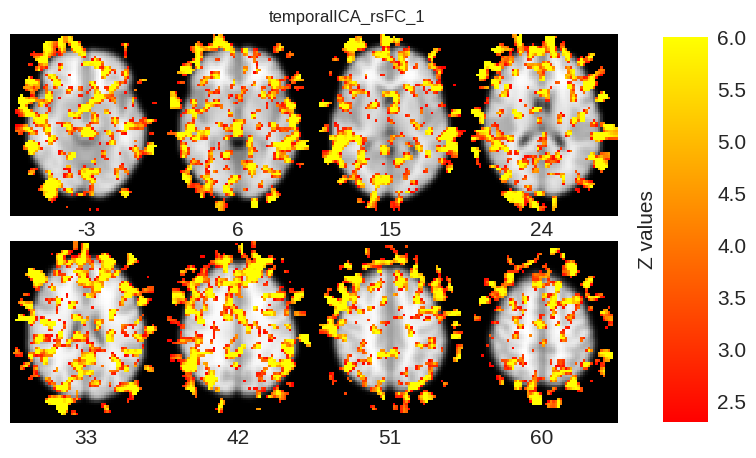

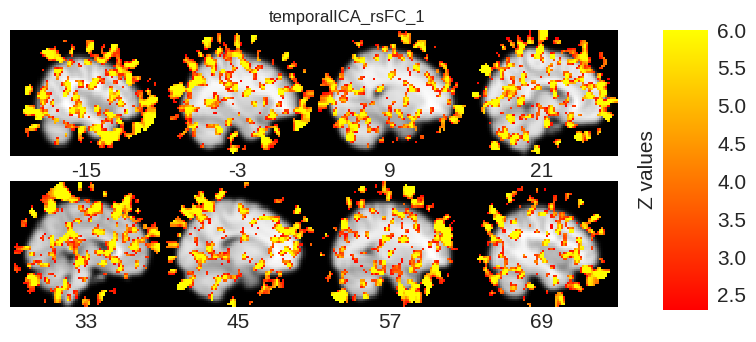

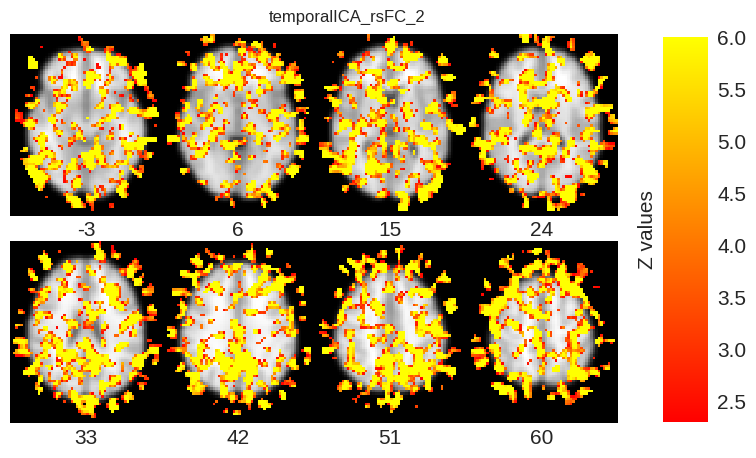

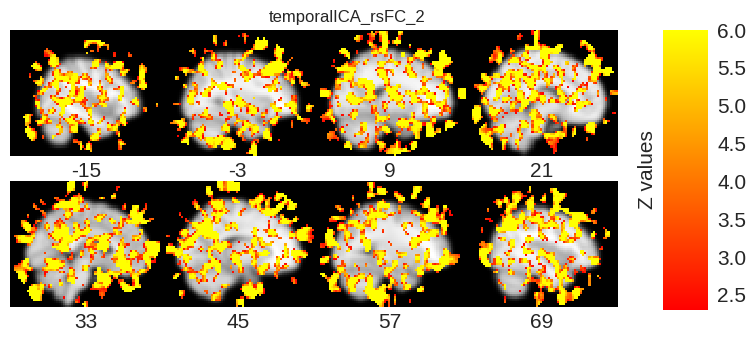

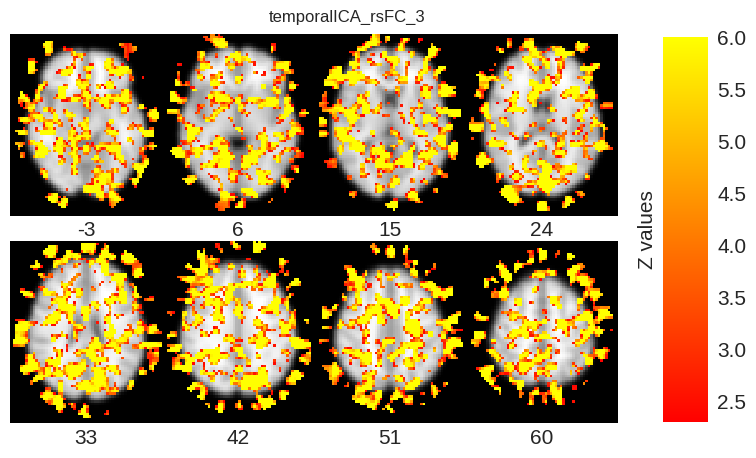

...

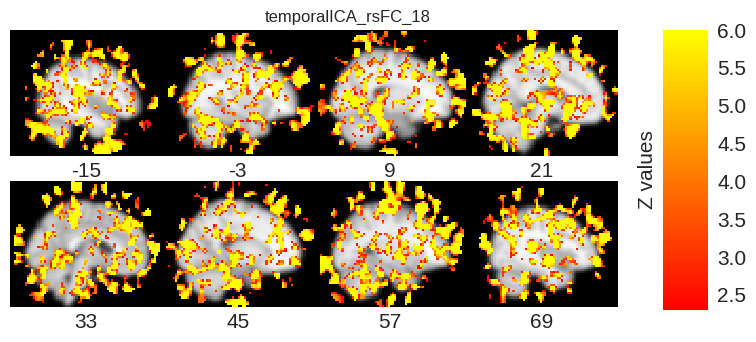

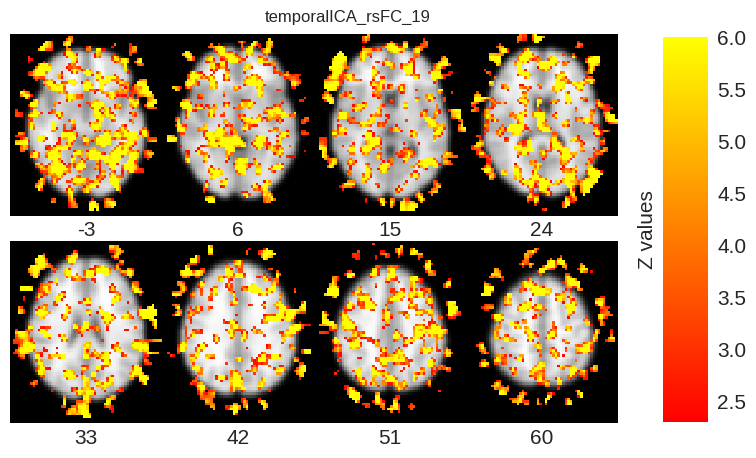

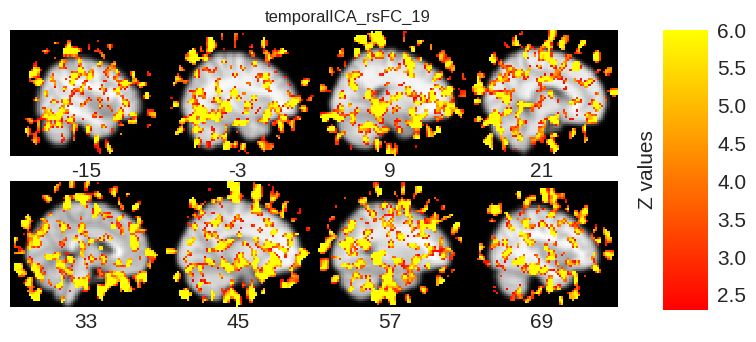

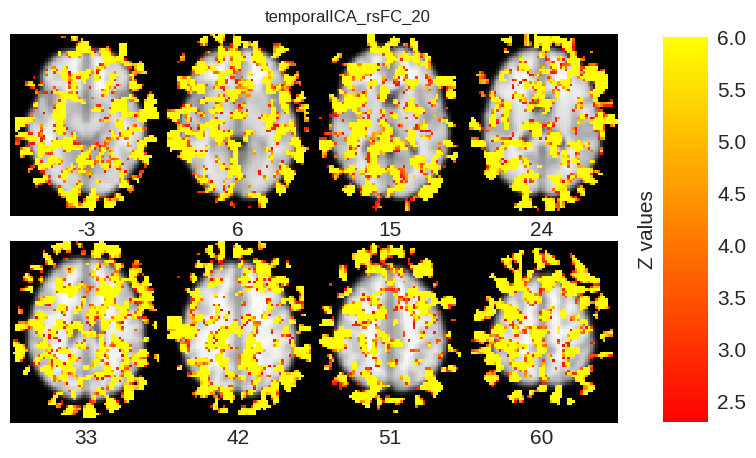

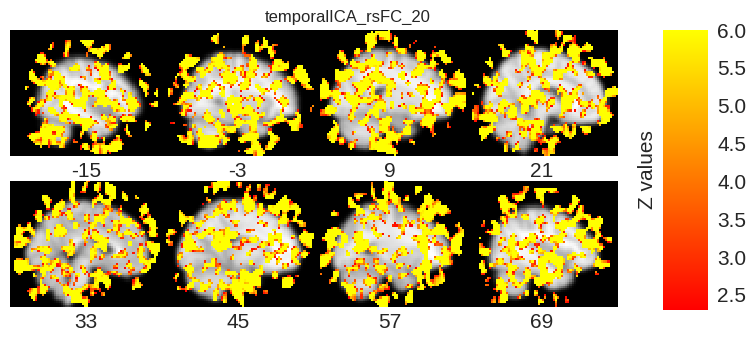

In [149]:
temporal_ICA_rsFC_pattern_loc = join('/Volume/CCNC_BI_3T_ext/thalamus_wmSCrsFC_20180109',
                                     'NOR103_ATH/DualRegression_TemporalICA',
                                     'rsFC_pattern',
                                     'ds3_bi_fwhm6_20ICs',
                                     'z2.3_NOR103_ATH_pattern_stage2.nii.gz')

temporal_ICA_rsFC_pattern_img = nb.load(temporal_ICA_rsFC_pattern_loc)
temporal_ICA_rsFC_pattern_data = temporal_ICA_rsFC_pattern_img.get_data()

for componentNumber in np.arange(temporal_ICA_rsFC_pattern_data.shape[-1]):
    data = temporal_ICA_rsFC_pattern_data[:,:,:,componentNumber]
    get_brain_figures(data, 
                      title='temporalICA_rsFC_{}'.format(componentNumber+1),
                      outputDir='temporalICA_rsFC',
                      save=False)

    get_brain_figures(data, 
                      title='temporalICA_rsFC_{}'.format(componentNumber+1),
                      outputDir='temporalICA_rsFC',
                      save=False, axial=False)